## 28-June-2024 == Edge NVIDIA Notebook for Search

#### Tim Spann @PaaSDev

### Milvus - Attu

![milvuslogo](https://milvus.io/images/milvus_logo.svg)


### CODE + COMMUNITY

Please join my meetup group NJ/NYC/Philly/Virtual. 

[https://www.meetup.com/unstructured-data-meetup-new-york/](https://www.meetup.com/unstructured-data-meetup-new-york/)

This notebook and other code is stored here:

https://github.com/tspannhw/AIM-XavierEdgeAI


#### Contact Us

Get Milvused!  [https://milvus.io/](https://milvus.io/)

Read my Newsletter every week! [https://github.com/tspannhw/FLiPStackWeekly/blob/main/142-17June2024.md](https://github.com/tspannhw/FLiPStackWeekly/blob/main/142-17June2024.md)

For more cool Unstructured Data, AI and Vector Database videos check out the Milvus vector database videos here
[https://www.youtube.com/@MilvusVectorDatabase/videos](https://www.youtube.com/@MilvusVectorDatabase/videos)

#### Unstructured Data Meetups 

[https://www.meetup.com/pro/unstructureddata/](https://www.meetup.com/pro/unstructureddata/)
[https://zilliz.com/community/unstructured-data-meetup](https://zilliz.com/community/unstructured-data-meetup)
[https://zilliz.com/event](https://zilliz.com/event)

#### [https://x.com/milvusio](Twitter/X)  

#### [https://www.linkedin.com/company/zilliz/](LinkedIn)

#### [https://discord.com/invite/FjCMmaJng6](Discord)

#### [https://milvusio.medium.com/](Blog)

#### Please star our [https://github.com/milvus-io/milvus](Github)

#### [https://www.youtube.com/@FLaNK-Stack](Youtube)

#### [https://medium.com/@tspann/subscribe](Blog)

In [1]:
import numpy as np
from pymilvus import connections
from pymilvus import utility
from pymilvus import FieldSchema, CollectionSchema, DataType, Collection
from pymilvus import MilvusClient
import uuid
from time import sleep
from math import isnan
import time
import sys
import datetime
import subprocess
import sys
import os
import traceback
import math
import base64
import json
from time import gmtime, strftime
import random, string
import base64
import socket 
import glob
import torch
from torchvision import transforms
from PIL import Image
import timm
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
import multiprocessing
import time
import requests
from transformers import BlipProcessor, BlipForConditionalGeneration
import io
import io
from IPython.display import display

In [2]:
# -----------------------------------------------------------------------------------------------
# Constants
# -----------------------------------------------------------------------------------------------

DIMENSION = 512

DATABASE_NAME = "./XavierEdgeAI.db"

COLLECTION_NAME = "XavierEdgeAI"

PATH = "/home/nvidia/nvme/images/"

BLIP_MODEL = "Salesforce/blip-image-captioning-large"


# -----------------------------------------------------------------------------------------------
# Milvus Collection
# -----------------------------------------------------------------------------------------------

milvus_client = MilvusClient(DATABASE_NAME)


In [3]:
# -----------------------------------------------------------------------------------------------
# Metadata Fields
# -----------------------------------------------------------------------------------------------

currenttimeofsave = datetime.datetime.now().strftime('%m/%d/%Y %H:%M:%S')
hostname = os.uname()[1]

print(hostname)
print(currenttimeofsave)

nvidia-desktop
06/28/2024 14:29:46


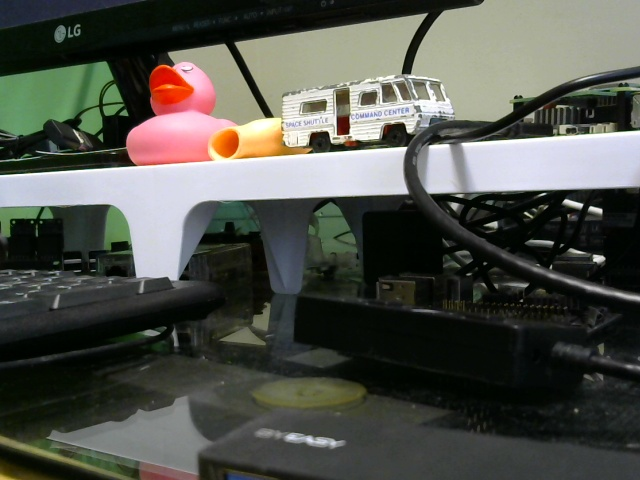

Caption: there is a blue toy duck sitting on a computer desk @ 06/27/2024 16:16:50ID: 450761703658881024


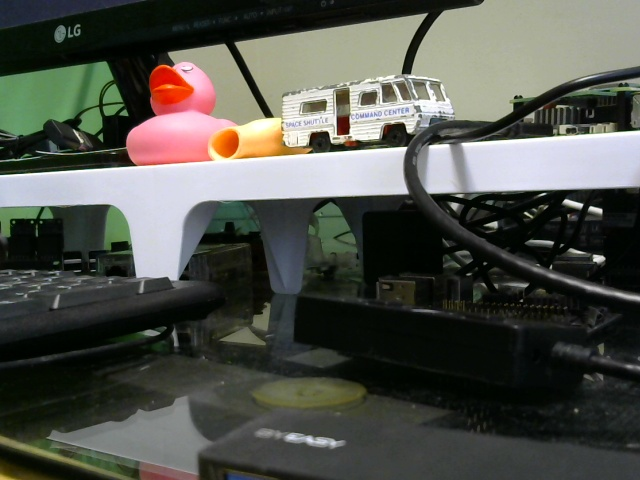

Caption: there is a blue toy duck sitting on a computer desk @ 06/27/2024 16:16:50ID: 450761703658881024


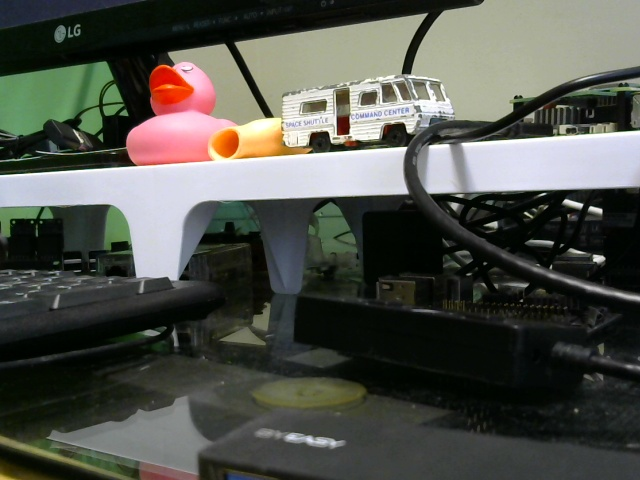

Caption: there is a blue toy duck sitting on a computer desk @ 06/27/2024 16:16:50ID: 450761703658881024


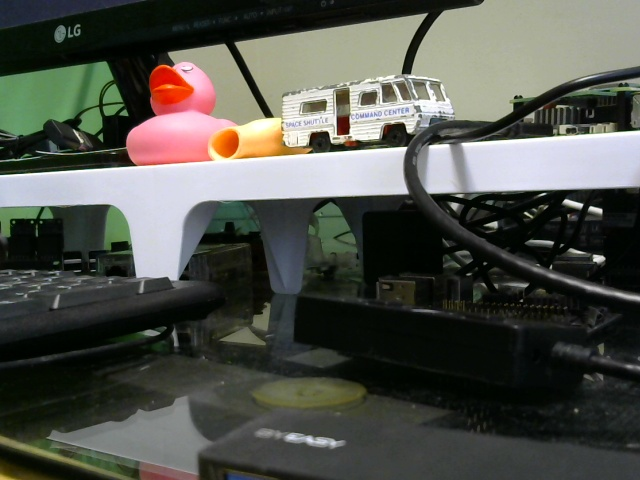

Caption: there is a blue toy duck sitting on a computer desk @ 06/27/2024 16:16:50ID: 450761703658881024


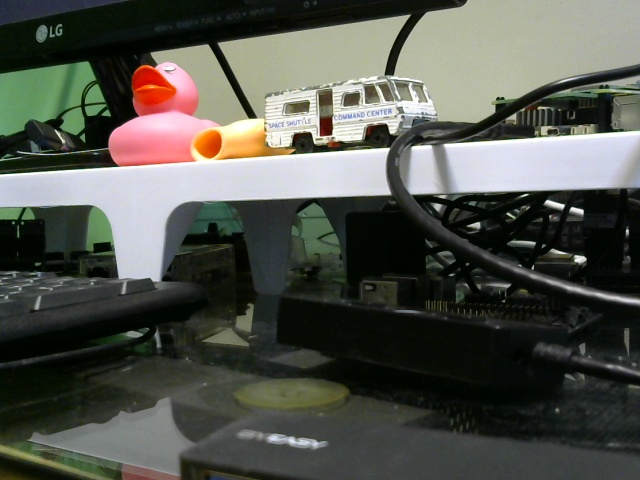

Caption: there is a blue rubber duck sitting on a computer desk @ 06/27/2024 16:21:09ID: 450761771507253248


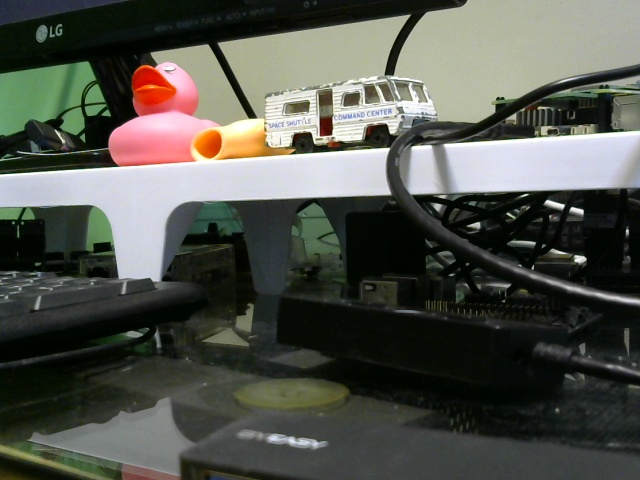

Caption: there is a blue rubber duck sitting on a computer desk @ 06/27/2024 16:21:09ID: 450761771507253248


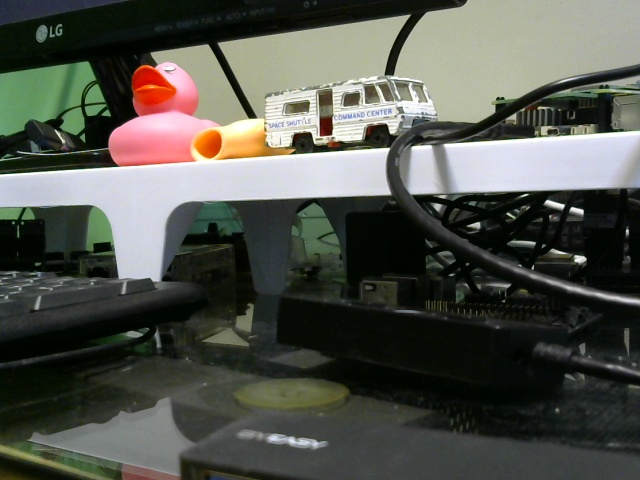

Caption: there is a blue rubber duck sitting on a computer desk @ 06/27/2024 16:21:09ID: 450761771507253248


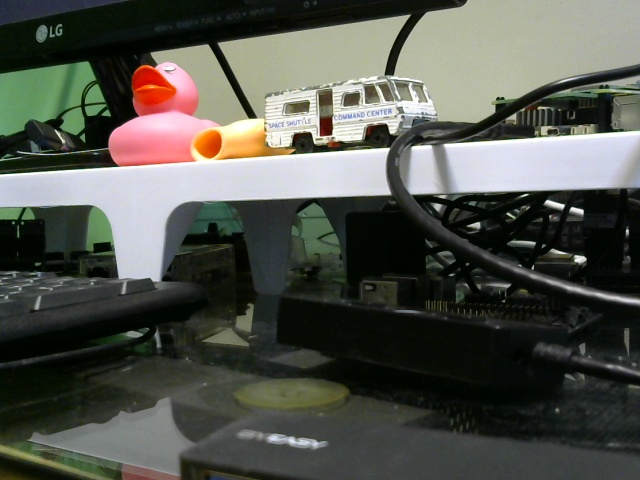

Caption: there is a blue rubber duck sitting on a computer desk @ 06/27/2024 16:21:09ID: 450761771507253248


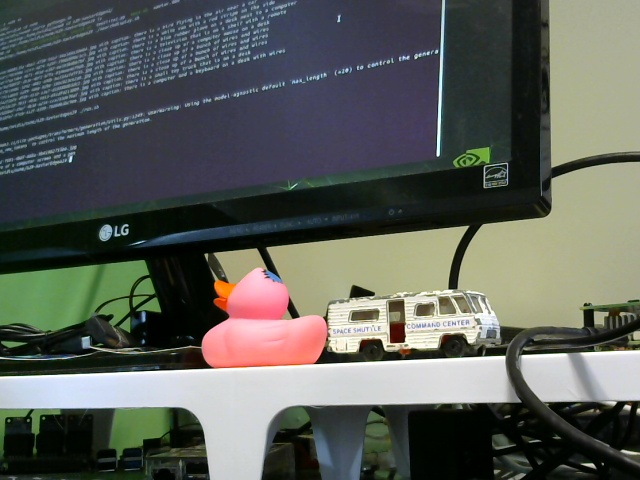

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:05ID: 450779088578674688


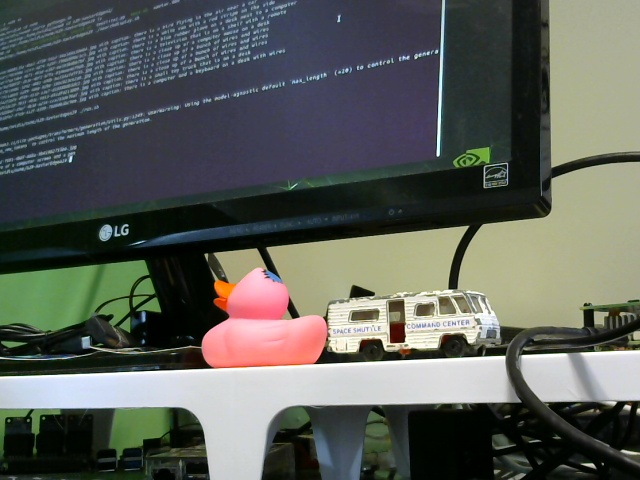

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:05ID: 450779088578674688


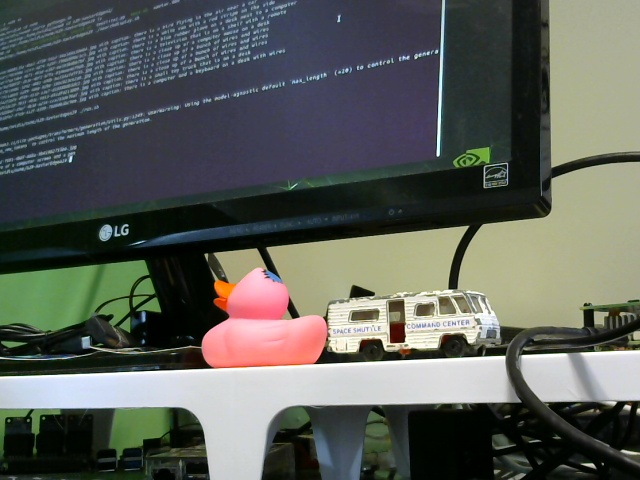

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:05ID: 450779088578674688


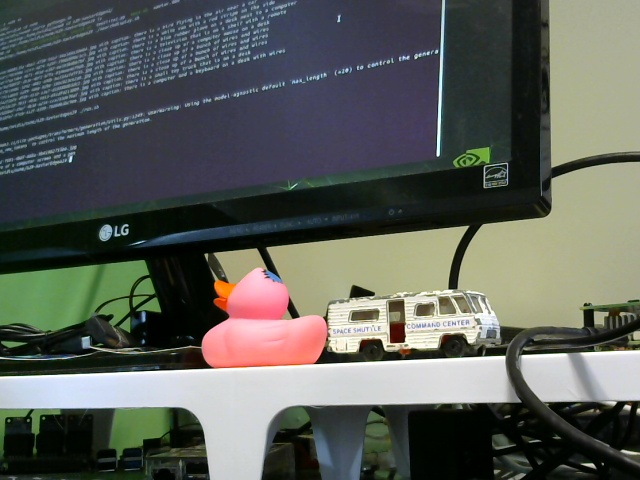

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:05ID: 450779088578674688


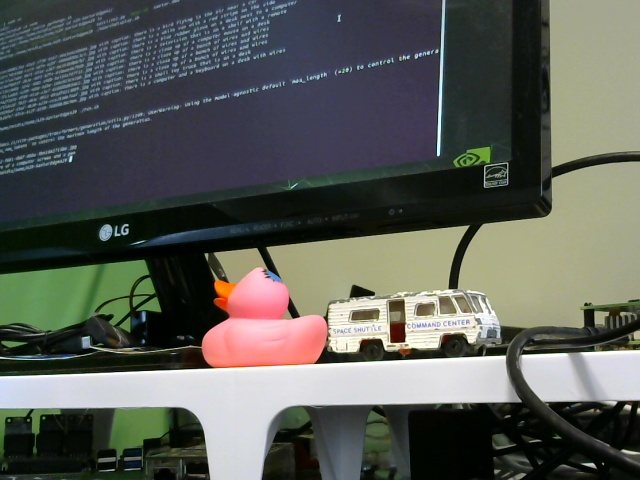

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:58ID: 450779102756470784


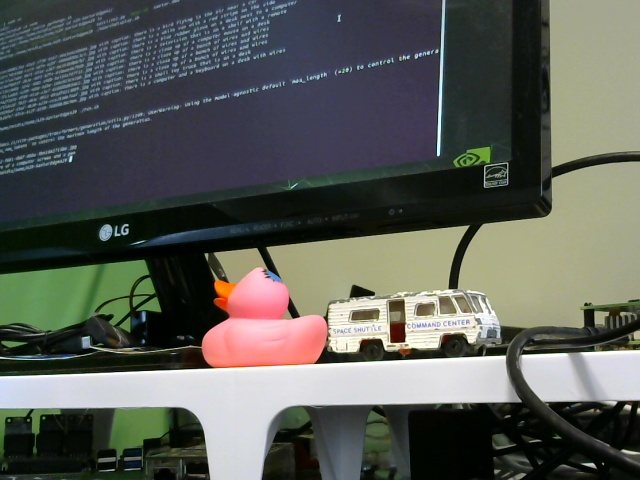

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:58ID: 450779102756470784


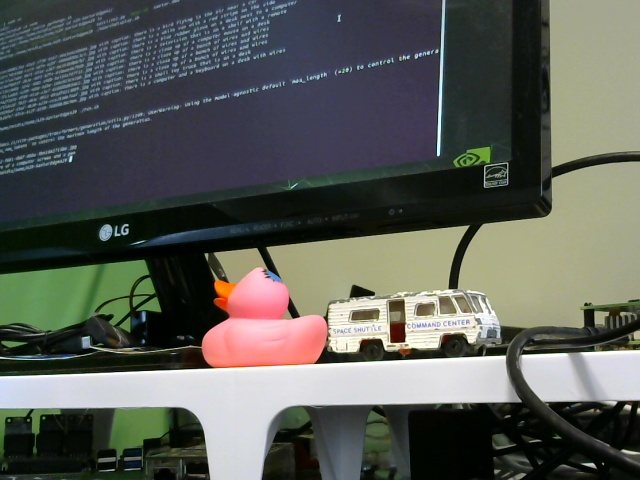

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:58ID: 450779102756470784


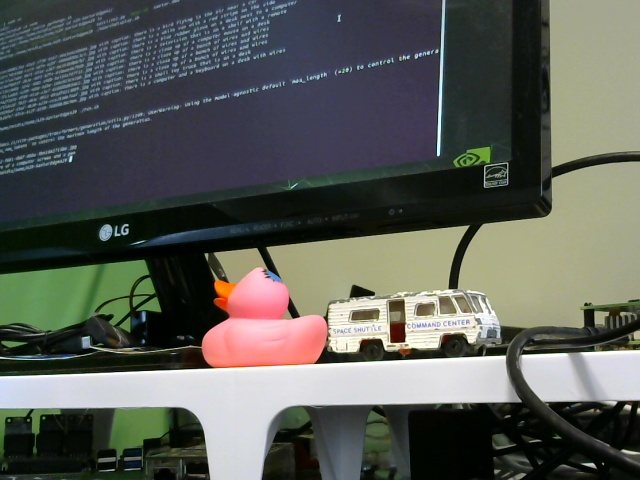

Caption: there is a purple rubber duck sitting on a desk next to a computer monitor @ 06/28/2024 10:42:58ID: 450779102756470784


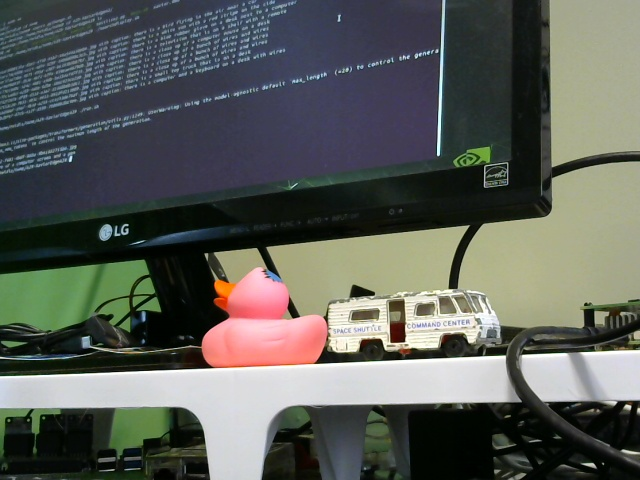

Caption: there is a purple rubber duck sitting on a desk next to a computer @ 06/28/2024 10:43:52ID: 450779116508807168


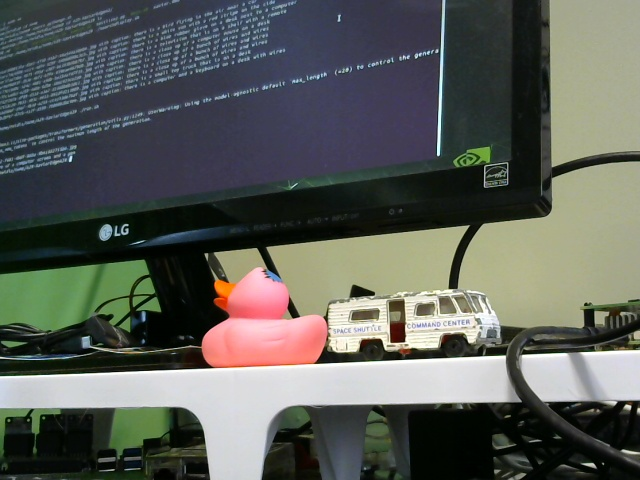

Caption: there is a purple rubber duck sitting on a desk next to a computer @ 06/28/2024 10:43:52ID: 450779116508807168


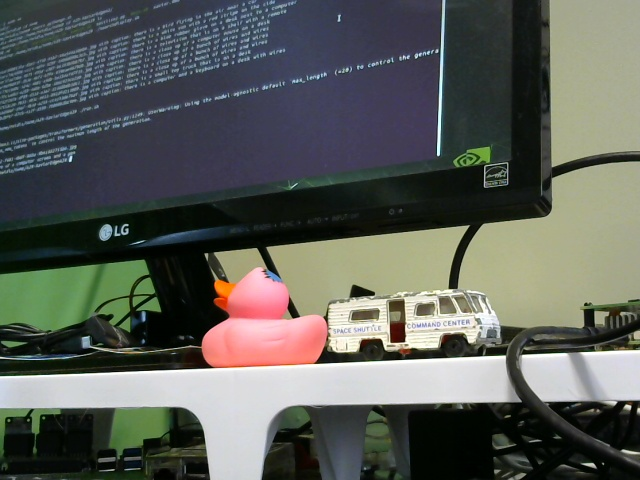

Caption: there is a purple rubber duck sitting on a desk next to a computer @ 06/28/2024 10:43:52ID: 450779116508807168


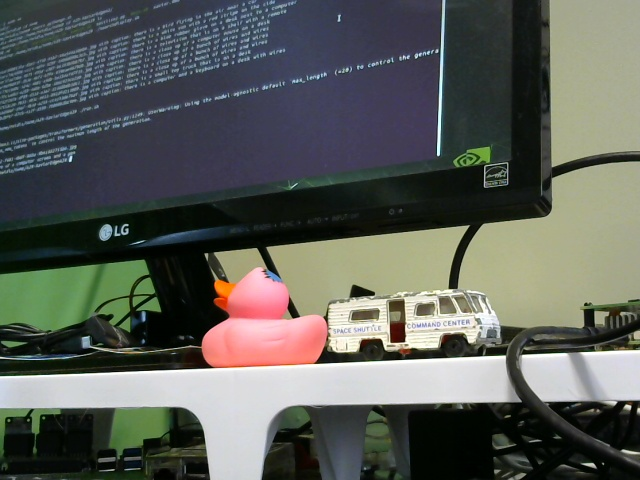

Caption: there is a purple rubber duck sitting on a desk next to a computer @ 06/28/2024 10:43:52ID: 450779116508807168
Search done


In [5]:
# -----------------------------------------------------------------------------
# Image Query By Filter (Caption)
# -----------------------------------------------------------------------------

try:
    results = milvus_client.query(
        collection_name=COLLECTION_NAME,
        filter="caption like '%duck%'",
        output_fields=["filename", "caption", "currenttime", "id"],
        limit = 5,
    )
    
    # print(results)
    
    for index in range(len(results)):
        for key in results[index]:
            img = Image.open(results[index]['filename'])
            display(img)   
            print("Caption: " + results[index]['caption'] + " @ " + results[index]['currenttime'] + "ID: " + str(results[index]['id']))
        
except Exception as e:
    print("An error:", e)

print("Search done")